/home/mateus-band/venv/lib/python3.12/site-packages/matplotlib/animation.py:908: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


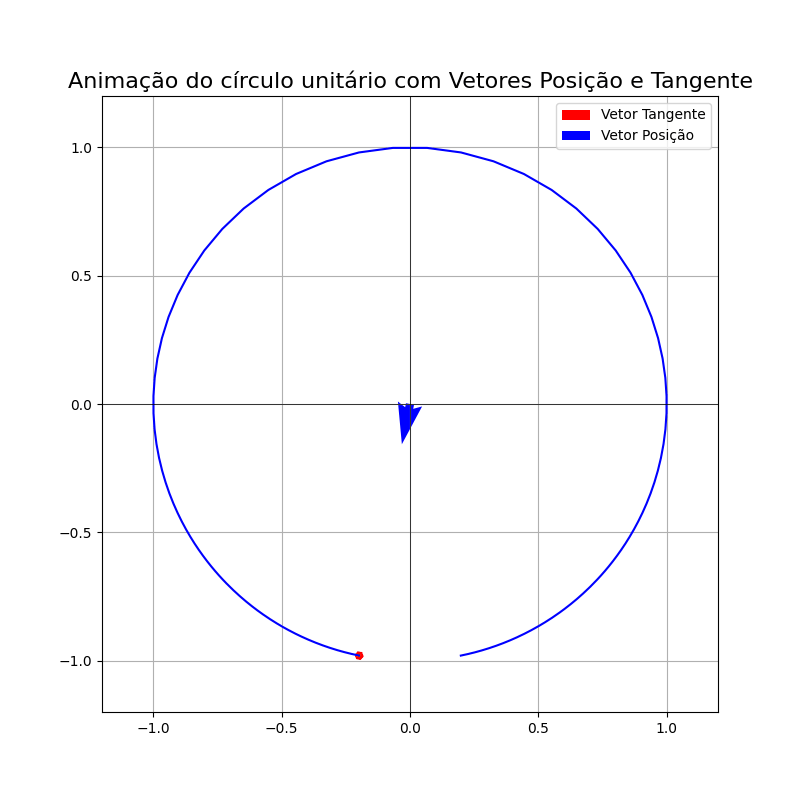

In [ ]:
#Q1q7

import sympy as sp
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

# Definição simbólica
t = sp.symbols('t')
x = 2*t/(1 + t**2)
y = (1 - t**2)/(1 + t**2)

# Derivadas simbólicas
dx = sp.diff(x, t)
dy = sp.diff(y, t)

# Funções numéricas
f_x = sp.lambdify('t', x, 'numpy')
f_y = sp.lambdify('t', y, 'numpy')
f_dx = sp.lambdify('t', dx, 'numpy')
f_dy = sp.lambdify('t', dy, 'numpy')

# Parâmetro t ajustado para "completar" o círculo na animação
t_vals = np.linspace(-10, 10, 300) # Intervalo maior e mais frames
xs = f_x(t_vals)
ys = f_y(t_vals)
dxs = f_dx(t_vals)
dys = f_dy(t_vals)

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_title('Animação do círculo unitário com Vetores Posição e Tangente', fontsize=16)
ax.plot(xs, ys, 'b-', linewidth=1.5) # Traça o círculo
ax.set_aspect('equal')
ax.grid(True)
ax.axhline(0, color='k', linewidth=0.5)
ax.axvline(0, color='k', linewidth=0.5)
ax.set_xlim(-1.2, 1.2)
ax.set_ylim(-1.2, 1.2)

# Vetor tangente (vermelho)
tangent_quiver = ax.quiver(xs[-1], ys[-1], dxs[-1], dys[-1], color='r', scale=15, width=0.015, label="Vetor Tangente")
# Vetor posição (azul)
position_quiver = ax.quiver(0, 0, xs[-1], ys[-1], color='b', scale=15, width=0.015, label="Vetor Posição")

ax.legend()

def update(frame):
    x_atual = xs[-1]
    y_atual = ys[-1]
    dx_atual = dxs[-1]
    dy_atual = dys[-1]

    if frame < len(t_vals):
        x_atual = xs[:frame+1][-1]
        y_atual = ys[:frame+1][-1]
        dx_atual = dxs[:frame+1][-1]
        dy_atual = dys[:frame+1][-1]

    tangent_quiver.set_offsets([x_atual, y_atual])
    tangent_quiver.set_UVC(dx_atual, dy_atual)
    position_quiver.set_UVC(x_atual, y_atual)
    position_quiver.set_offsets([0, 0]) # Origem fixa

    return tangent_quiver, position_quiver

ani = FuncAnimation(fig, update, frames=len(t_vals), blit=True, interval=30)

gif_filename = 'circulo_vetores.gif'
writer = PillowWriter(fps=30)
ani.save(gif_filename, writer=writer)
plt.close(fig)
display(Image(filename=gif_filename))

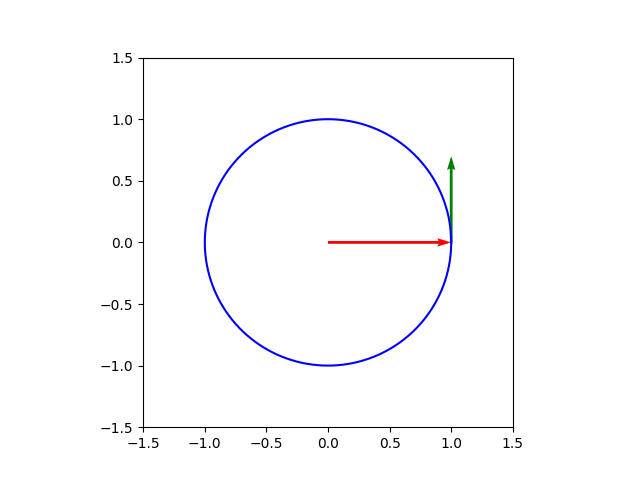

In [ ]:
#Questão 2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import sympy as sp
from sympy import symbols, cos, sin, diff, lambdify
from PIL import Image as PILImage
from IPython.display import Image, display
from typing import List



theta = np.linspace(0, 2*np.pi, 300)
x_circ = np.cos(theta)
y_circ = np.sin(theta)

fig, ax = plt.subplots()
ax.plot(x_circ, y_circ, 'b', label='círculo')
ax.set_aspect('equal')
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)


vetor_pos = ax.quiver(0, 0, 0, 0, angles='xy', scale_units='xy', scale=1, color='r', label='posição')
vetor_tan = ax.quiver(0, 0, 0, 0, angles='xy', scale_units='xy', scale=1, color='g', label='tangente')

def update(frame):
    x_end = np.cos(frame)
    y_end = np.sin(frame)
    
    vetor_pos.set_UVC(x_end, y_end)
    
    scale = 0.7
    dx = -np.sin(frame) * scale
    dy = np.cos(frame) * scale
    vetor_tan.set_offsets([x_end, y_end])
    vetor_tan.set_UVC(dx, dy)
    return vetor_pos, vetor_tan

ani = FuncAnimation(fig, update, frames=np.linspace(0, 2*np.pi, 100), blit=False, interval=50)


gif_path = "animacao_circulo.gif"
ani.save(gif_path, writer=PillowWriter(fps=20))

plt.close(fig)  


display(Image(filename=gif_path))

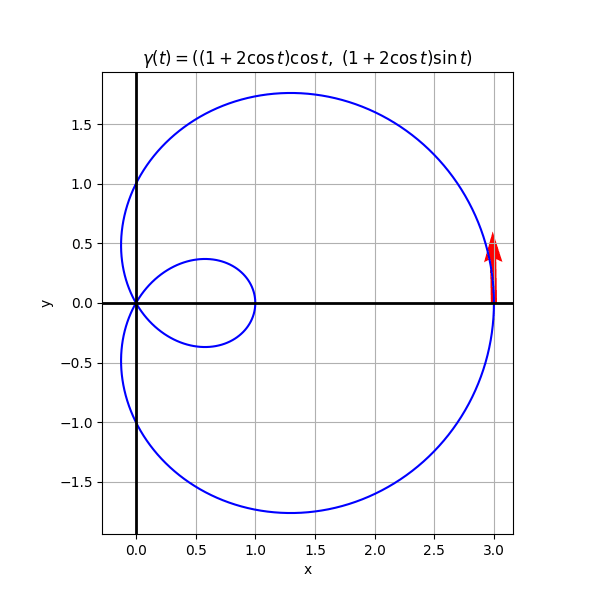

In [2]:
#Questão 3

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

t = np.linspace(0, 2*np.pi, 300)
x = (1 + 2 * np.cos(t)) * np.cos(t)
y = (1 + 2 * np.cos(t)) * np.sin(t)

dx = np.gradient(x, t)
dy = np.gradient(y, t)

fig, ax = plt.subplots(figsize=(6,6))
ax.plot(x, y, 'b', label='Curva')
ax.axhline(0, color='k', linewidth=2)
ax.axvline(0, color='k', linewidth=2)
ax.set_aspect('equal')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title(r'$\gamma(t) = ((1 + 2\cos t)\cos t,\ (1 + 2\cos t)\sin t)$')
ax.grid(True)

# Inicializa o vetor tangente (velocidade) como quiver
vetor_tan = ax.quiver(x[0], y[0], dx[0], dy[0], angles='xy', scale_units='xy', scale=5, color='r', width=0.015)

def update(i):
    px, py = x[i], y[i]
    vx, vy = dx[i], dy[i]
    vetor_tan.set_offsets([px, py])
    vetor_tan.set_UVC(vx, vy)
    return vetor_tan,

ani = FuncAnimation(fig, update, frames=len(t), blit=True, interval=40)

gif_path = "curva_parametrizada_tangente.gif"
ani.save(gif_path, writer=PillowWriter(fps=25))
plt.close(fig)

display(Image(filename=gif_path))

In [ ]:
#Questão 10

import numpy as np
import sympy
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation


fig, ax = plt.subplots(figsize=(6, 6))
ax.set_aspect('equal')
ax.set_title('Espiral Logarítmica com Vetor Tangente')
ax.grid(True, linestyle='--', alpha=0.6)

a = 0.1
b = 0.1


num_frames = 300
t = np.linspace(0, 4 * np.pi, num_frames)
x_std = a * np.exp(b * t) * np.cos(t)
y_std = a * np.exp(b * t) * np.sin(t)
line_std, = ax.plot([], [], 'b-', lw=2, label='Curva α(t)')


x_prime = a * np.exp(b * t) * (b * np.cos(t) - np.sin(t))
y_prime = a * np.exp(b * t) * (b * np.sin(t) + np.cos(t))

quiver = ax.quiver(x_std[0], y_std[0], x_prime[0], y_prime[0],
                   color='r', angles='xy', scale_units='xy', scale=1,
                   label="Vetor Tangente α'(t)")

max_val = np.max(np.abs(np.concatenate([x_std, y_std]))) * 1.1
ax.set_xlim(-max_val, max_val)
ax.set_ylim(-max_val, max_val)
ax.legend(loc='upper left')


def update(frame):
    line_std.set_data(x_std[:frame+1], y_std[:frame+1])
    quiver.set_offsets((x_std[frame], y_std[frame]))
    quiver.set_UVC(x_prime[frame], y_prime[frame])
    return line_std, quiver


ani = FuncAnimation(fig, update, frames=num_frames, blit=True, interval=40)
try:
    ani.save('espiral_tangente.gif', writer='imagemagick', fps=25)
    print("Animação salva como 'espiral_tangente.gif'")
except Exception as e:
    print(f"Erro ao salvar a animação: {e}")
plt.close(fig)

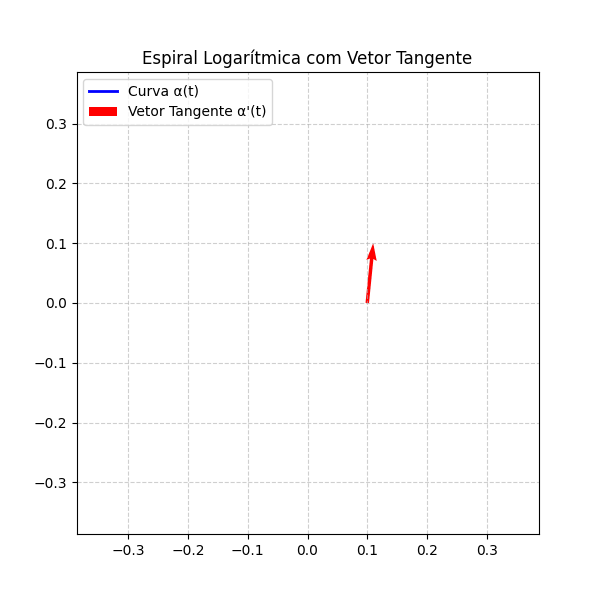

In [5]:
from IPython.display import Image, display

display(Image(filename="espiral_tangente.gif"))

MovieWriter imagemagick unavailable; using Pillow instead.


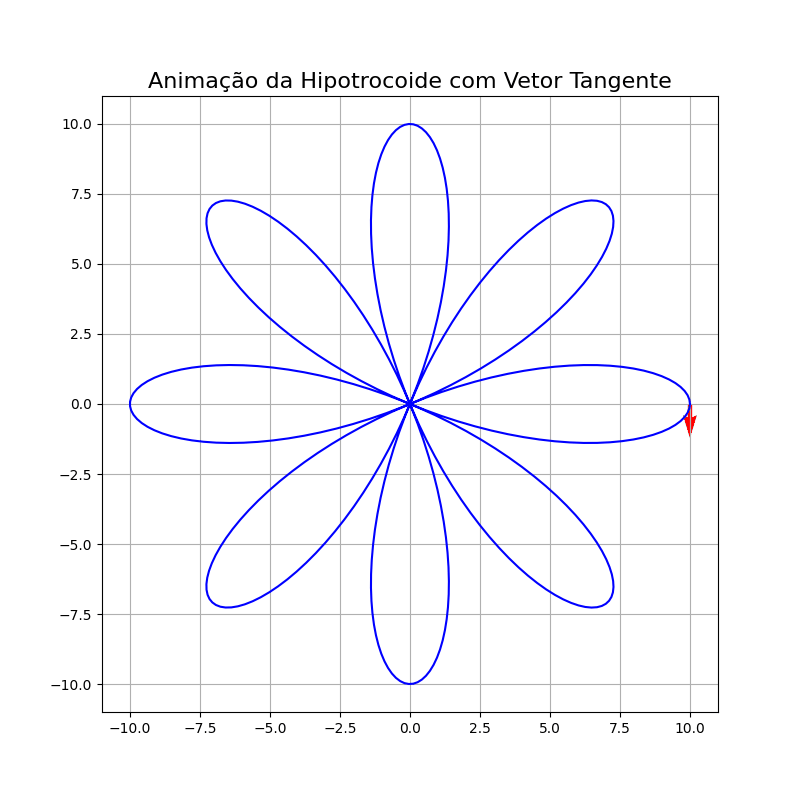

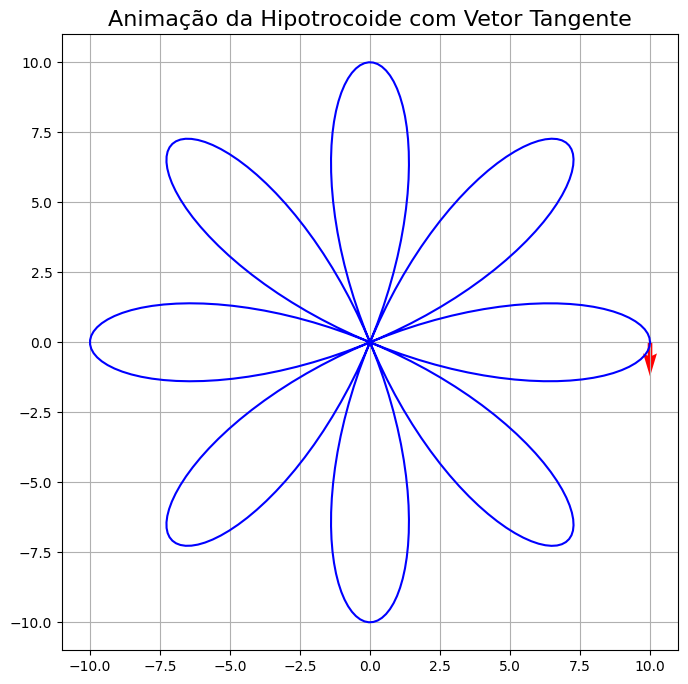

In [3]:
#Questão 7

import sympy as sp
from sympy.plotting import plot_parametric
from IPython.display import Image, display
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation


#Hypotrochoid
#x=(a−b)cos(t)+ccos((a/b−1)t),y=(a−b)sin(t)−csin((a/b−1)t)

a, b, c = sp.symbols('a b c')

def alpha(valores):
    t, a, b, c = sp.symbols('t a b c')
    x = (a - b) * sp.cos(t) + c * sp.cos((a/b - 1) * t)
    y = (a - b) * sp.sin(t) - c * sp.sin((a/b - 1) * t)
    return x.subs(valores), y.subs(valores)

def deriv(valores):
    x, y = alpha(valores)
    t = sp.symbols('t')
    dx_dt = sp.diff(x, t)
    dy_dt = sp.diff(y, t)
    return dx_dt.subs(valores), dy_dt.subs(valores)




t_vals = np.linspace(0, 6*3.14159, 400)

valores = {a: 8, b: 3, c: 5}

xf, yf = alpha(valores)

dx, dy = deriv(valores)

f_x = sp.lambdify('t', xf, 'numpy')
f_y = sp.lambdify('t', yf, 'numpy')
f_dx = sp.lambdify('t', dx, 'numpy')
f_dy = sp.lambdify('t', dy, 'numpy')


xs= f_x(t_vals)
ys= f_y(t_vals)
dxs= f_dx(t_vals)
dys= f_dy(t_vals)

def update_quiver(frame):
    quiver.set_offsets((xs[frame], ys[frame]))
    quiver.set_UVC(dxs[frame], dys[frame])
    return quiver,

nframes = len(t_vals)

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_title('Animação da Hipotrocoide com Vetor Tangente', fontsize=16)
ax.plot(xs, ys, 'b-') 
ax.set_aspect('equal')
ax.grid(True)

quiver = ax.quiver(xs[0], ys[0], dxs[0], dys[0], color='r')

ani = FuncAnimation(fig, update_quiver, frames=nframes, blit=True)

ani.save('hipotrocoide.gif', writer='imagemagick', fps=30)
display(Image(filename="hipotrocoide.gif"))


